<a href="https://colab.research.google.com/github/StarryNight7210/Bioinformatics---scRNA-Sequencing-Analysis/blob/main/Alzheimer's_Project_using_combined_data_presentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import necessary libraries + import data file from Drive + prepare for processing


In [46]:
%pip install scanpy python-igraph leidenalg

# import packages
import numpy as np
import pandas as pd
import scanpy as sc
from scipy import sparse
import os
import gc

sc.settings.verbosity = 3   # verbosity: errors (0), warnings (1), info (2), hints (3)

# customize resolution and color of your figures
sc.settings.set_figure_params(dpi=80, figsize=(4,4))

In [47]:
# get the file of data from Google Drive

from google.colab import drive
drive.mount('/content/drive')

counts_df = pd.read_pickle('/content/drive/MyDrive/counts_df.pkl')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


See the data frame and its dimensions

In [48]:
counts_df

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,BX072566.1,AL354822.1,AC023491.2,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,Source
CTGCAGGTCGTGGGAA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
AGAAGTAGTGTCCGGT-1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
CTGATCCAGCCGTTAT-1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
GTAACCATCAGCGCGT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
CTCCCAATCGACTCCT-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGAACAATCAACGAGG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,3
CTCTCAGGTGTCCGTG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
TCCTGCACACAATGAA-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
CGGAACCGTTGTGTTG-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3


In [49]:
counts_df.shape

(14384, 33539)

Create the AnnData object, used for cells and genes analysis

In [50]:
# Create AnnData object
# AnnData expects X to be a cells x genes matrix
# obs is more information on each cell
# var is more information on each gene (leaving blank)
# Sample: adata = sc.AnnData(X, obs=pd.DataFrame(index=obs_names), var=pd.DataFrame(index=var_names))
adata = sc.AnnData(counts_df)

adata.X = sparse.csr_matrix(adata.X)

# since the data has a numerical source tag, convert it into a string indicating AD/CT and patient number

adata.obs["Source"] = counts_df["Source"].apply(lambda x: [None, 'AD1', 'CT2', 'AD3', 'CT4'][x])

print(adata)

/usr/local/lib/python3.12/dist-packages/legacy_api_wrap/__init__.py:82: UserWarning:

X converted to numpy array with dtype int64

/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1792: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1794: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



AnnData object with n_obs × n_vars = 14384 × 33539
    obs: 'Source'


In [51]:
# all the cell barcodes and the patient
# data is not shown here but is present in AnnData object
adata.obs

,Source
CTGCAGGTCGTGGGAA-1,AD1
AGAAGTAGTGTCCGGT-1,CT2
CTGATCCAGCCGTTAT-1,AD1
GTAACCATCAGCGCGT-1,AD1
CTCCCAATCGACTCCT-1,AD1
...,...
AGAACAATCAACGAGG-1,AD3
CTCTCAGGTGTCCGTG-1,CT4
TCCTGCACACAATGAA-1,CT4
CGGAACCGTTGTGTTG-1,AD3


Pre-processed w/ PCA

filtered out 5736 genes that are detected in less than 3 cells


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1792: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1794: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



normalizing counts per cell


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1792: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1794: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/usr/local/lib/python3.12/dist-packages/scanpy/preprocessing/_scale.py:309: UserWarning:

Received a view of an AnnData. Making a copy.

/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1792: UserWarning:

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.

/usr/lib/python3.12/functools.py:912: UserWarning:

zero-centering a sparse array/matrix densifies it.



computing PCA
    with n_comps=50
    finished (0:00:13)


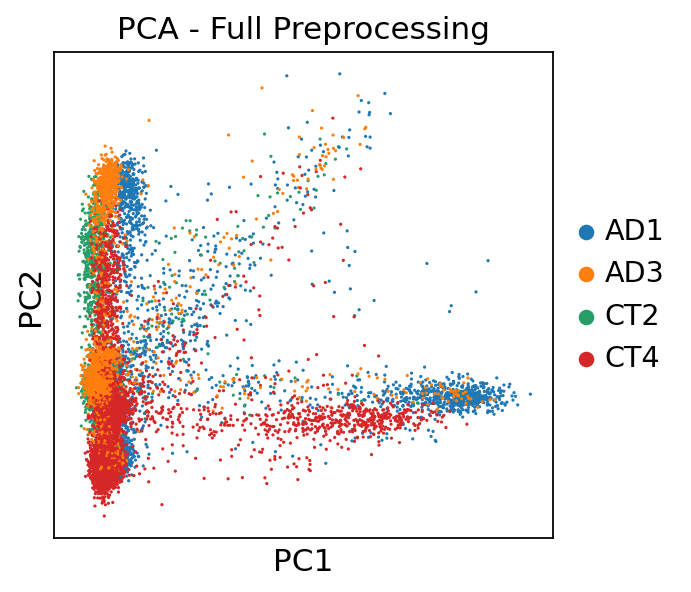

In [52]:
mincells = 3 # min cells value
mingenes = 1 # min_genes
targetsum = 1e4 # target_sum
HVGnum = 2000 # numbertop genes of
MaxScaleValue = 10 # max scale value

# computing PCA using the AnnData object and generating a diagram
adata_full = adata
sc.pp.filter_genes(adata_full, min_cells=mincells)
sc.pp.filter_cells(adata_full, min_genes=mingenes)
sc.pp.normalize_total(adata_full, target_sum=targetsum)
sc.pp.log1p(adata_full)
sc.pp.highly_variable_genes(adata_full, n_top_genes=HVGnum)
adata_full = adata_full[:, adata_full.var['highly_variable']]
sc.pp.scale(adata_full, max_value=MaxScaleValue)
sc.tl.pca(adata_full, svd_solver='arpack')
sc.pl.pca(adata_full, title="PCA - Full Preprocessing", color='Source')

# Clustering Algorithms

Code below in this box is for K-means, a clustering algorithm

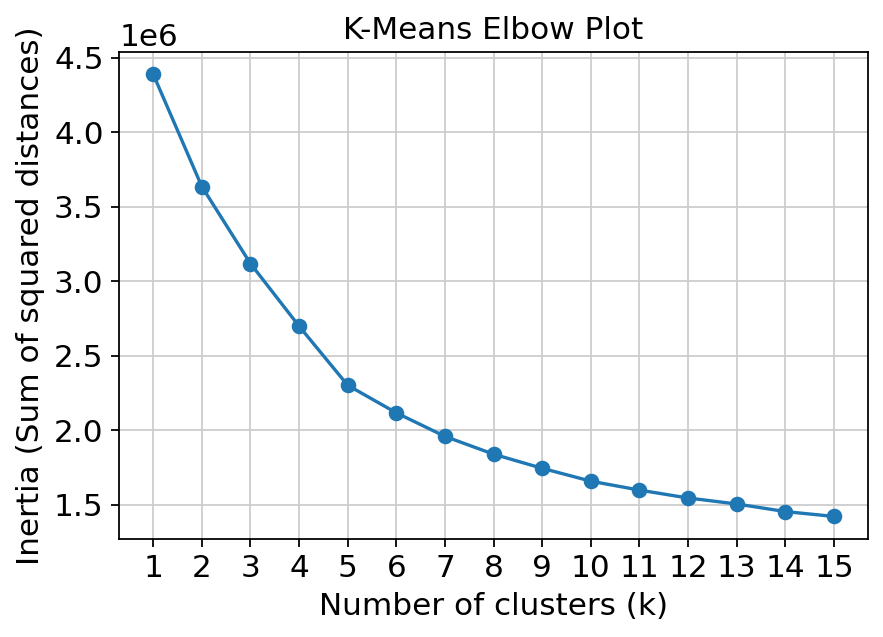

In [53]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Generate K-Means plots of different k values
inertia = []
k_values = range(1, 16)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=20)
    kmeans.fit(adata_full.obsm['X_pca'])
    inertia.append(kmeans.inertia_)  # sum of squared distances to cluster centers

# Create Elbow Plot - Used to determine number of clusters for k-means only
plt.figure(figsize=(6,4))
plt.plot(k_values, inertia, marker='o')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia (Sum of squared distances)')
plt.title('K-Means Elbow Plot')
plt.xticks(k_values)
plt.grid(True)
plt.show()

Running 3 clustering algorithms and comparing - Leiden is the one we'll use for the rest of the processing and analysis

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Louvain clustering
    finished: found 21 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:14)


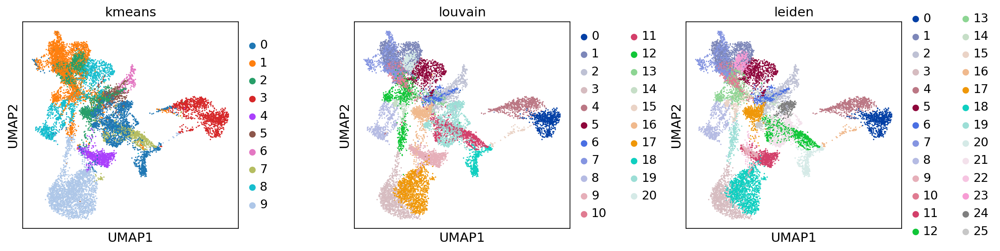

In [54]:
#K-Means Clustering
kmeans = KMeans(n_clusters=10, n_init=50, random_state=0)
adata_full.obs['kmeans'] = kmeans.fit_predict(adata_full.obsm['X_pca']).astype(str)

# Build k-NN graph first
sc.pp.neighbors(adata_full, n_neighbors=15, use_rep='X_pca')

# Run Louvain
sc.tl.louvain(adata_full, resolution=1.0, key_added='louvain', random_state=0, flavor='igraph')

# Run Leiden
sc.tl.leiden(adata_full, resolution=1.0, key_added='leiden', random_state=0, flavor = 'igraph')

# Make diagrams of all three
sc.tl.umap(adata_full, n_components=3)
sc.pl.umap(adata_full, color=['kmeans', 'louvain', 'leiden'], wspace=0.4)

This diagram is interactive, try rotating and zooming in/out

In [55]:
# 3D diagram of Leiden clusters, interactive

import plotly.express as px

fig = px.scatter_3d(
    pd.DataFrame(
    adata_full.obsm['X_umap'][:, 0:3],
    columns=['UMAP1', 'UMAP2', 'UMAP3']),
    x= 'UMAP1', y= 'UMAP2', z= 'UMAP3',
    color= adata_full.obs['leiden'],
    title='3D UMAP Plot (colored by Leiden clusters)',
)

fig.update_traces(marker_size=4)
fig.show()


In [56]:
# AnnData object with clustering results from all three algorithms attached to each cell

adata_full.obs

,Source,n_genes,kmeans,louvain,leiden
CTGCAGGTCGTGGGAA-1,AD1,1598,3,0,0
AGAAGTAGTGTCCGGT-1,CT2,5179,1,1,1
CTGATCCAGCCGTTAT-1,AD1,3666,6,2,2
GTAACCATCAGCGCGT-1,AD1,810,5,2,2
CTCCCAATCGACTCCT-1,AD1,1920,9,3,3
...,...,...,...,...,...
AGAACAATCAACGAGG-1,AD3,4399,1,1,1
CTCTCAGGTGTCCGTG-1,CT4,1329,9,17,18
TCCTGCACACAATGAA-1,CT4,1996,9,17,18
CGGAACCGTTGTGTTG-1,AD3,1287,8,14,15


# Find the most prominent marker genes in each cluster, and visualizations

Visualizations from presentation are below, but might not be in the same order

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning:

invalid value encountered in log2

/usr/local/lib/python3.12/dist-packages/scanpy/tools/_rank_genes_groups.py:4

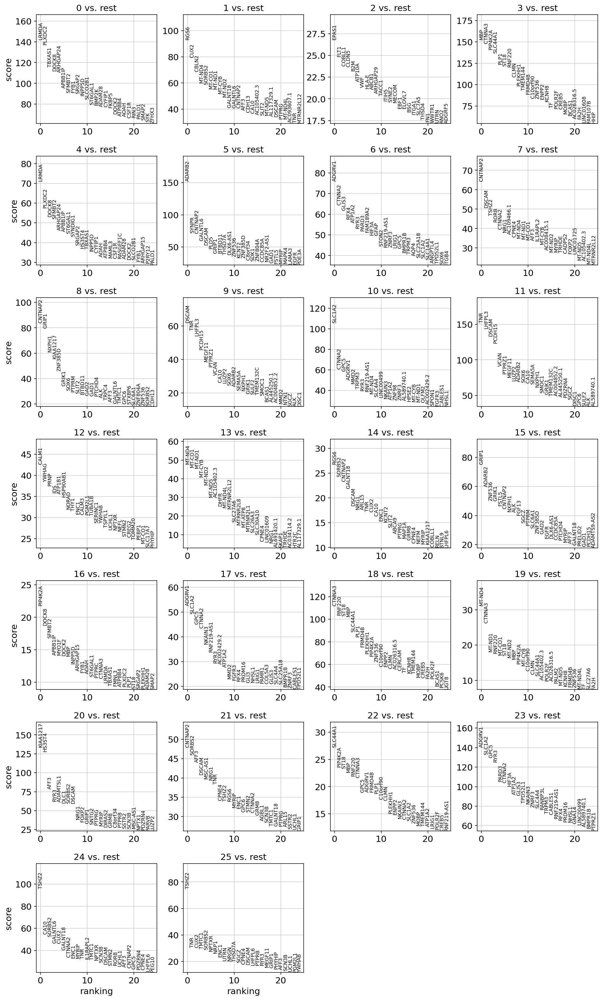

In [57]:
# Rank marker genes per cluster
sc.tl.rank_genes_groups(
    adata_full,
    groupby='leiden',    # column in adata.obs with cluster labels
    method='t-test',     # 't-test', 'wilcoxon', or 'logreg'
    pts=True             # include fraction of cells expressing gene
)

# See top 25 genes per cluster
sc.pl.rank_genes_groups(adata_full, n_genes=25, sharey=False)

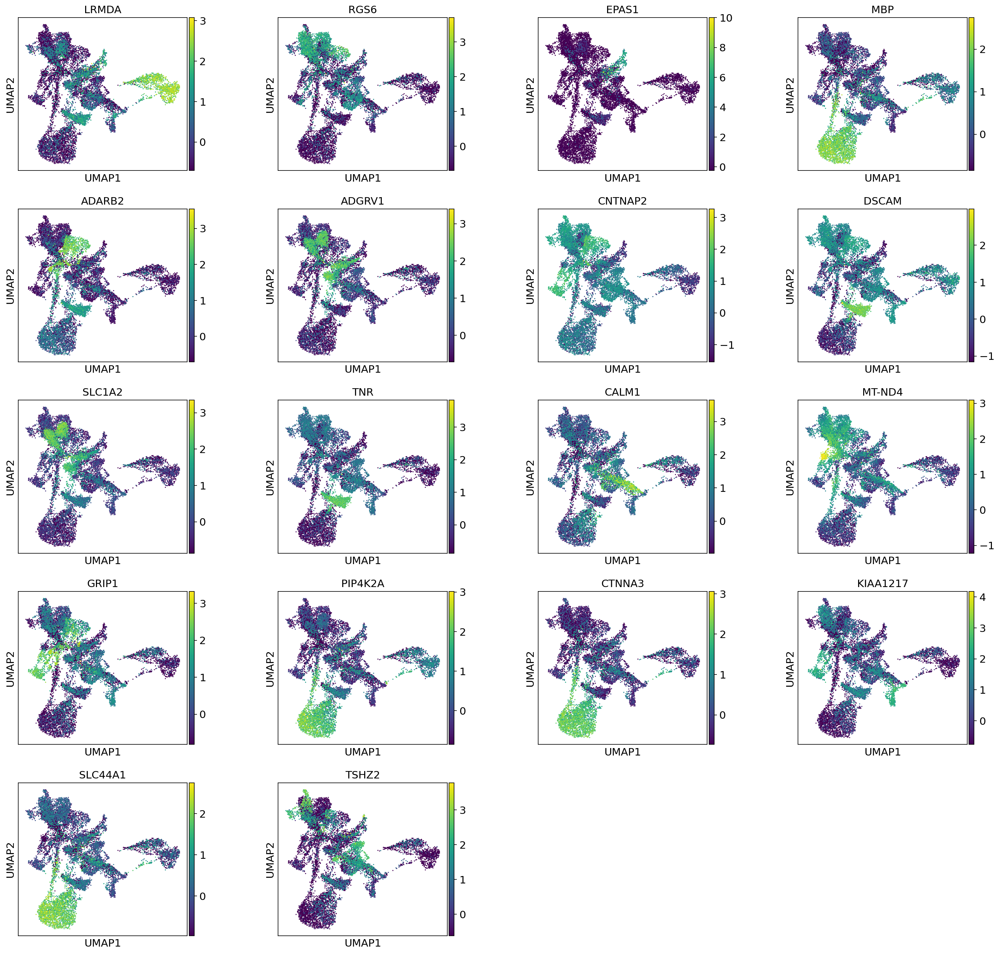

In [58]:
# show top gene from each cluster

df = sc.get.rank_genes_groups_df(adata_full, None)
top_genes = df.groupby("group").head(1)['names'].unique().tolist()
sc.pl.umap(adata_full, color=top_genes, wspace=0.4)

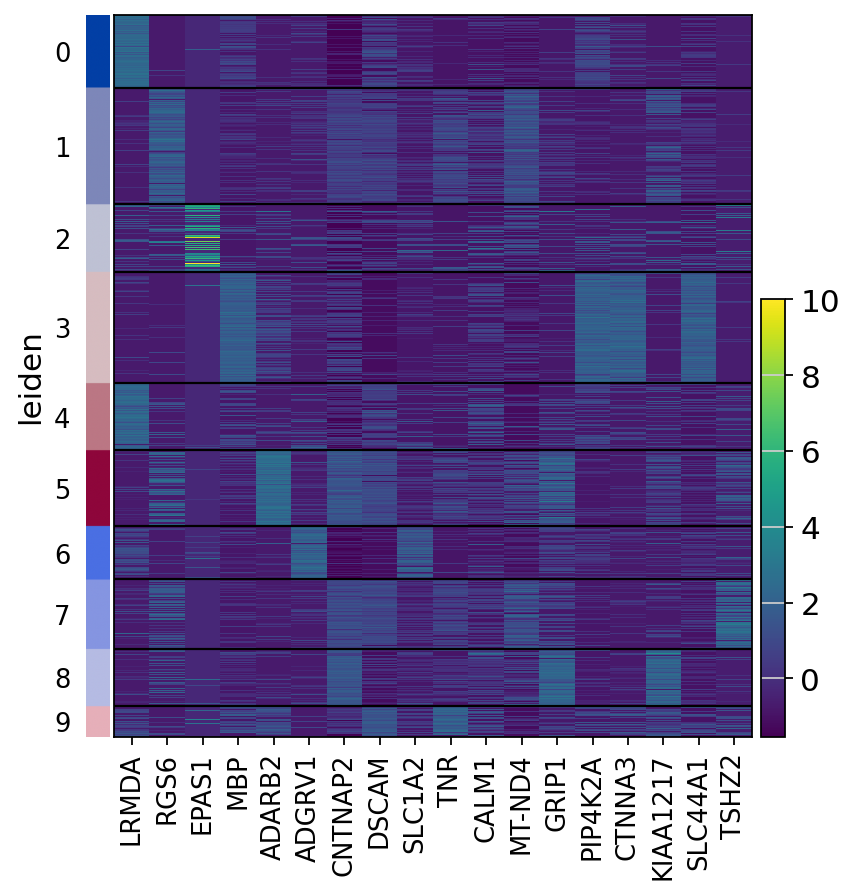

In [59]:
sc.pl.heatmap(
    adata_full[adata_full.obs['leiden'].isin([str(x) for x in range(10)])],   # only showing first 10 clusters (0-9)
    var_names=list(top_genes),
    groupby='leiden',
    use_raw=False,
    cmap='viridis')

# Determining cell type in each cluster

In [60]:
# take top 2000 genes
# use t-tests to see what cluster each gene corresponds to
# higher score = stronger marker gene

results = adata_full.uns['rank_genes_groups']
out = np.array([[0, 0, 0, 0, 0]])
for group in results['names'].dtype.names:
    out = np.vstack((out, np.vstack((
            results['names'][group],
            results['scores'][group],
            results['pvals_adj'][group],
            results['logfoldchanges'][group],
            np.array([group] * len(results['names'][group]))
        )).astype('object').T
    ))

print(out.shape)

pd.DataFrame(out[1:], columns=['Gene', 'scores', 'pval_adj', 'lfc', 'cluster'])

(52001, 5)


,Gene,scores,pval_adj,lfc,cluster
0,LRMDA,142.031738,0.0,NaN,0
1,PLXDC2,137.008316,0.0,NaN,0
2,TBXAS1,115.800026,0.0,NaN,0
3,DOCK8,111.962479,0.0,NaN,0
4,ARHGAP24,110.54084,0.0,NaN,0
...,...,...,...,...,...
51995,MSR1,-27.675171,0.0,NaN,25
51996,LINC01094,-27.695272,0.0,NaN,25
51997,HIF3A,-30.185068,0.0,NaN,25
51998,ALDH1A1,-34.05249,0.0,NaN,25


Clicking the button that looks like a calculator next to the output below makes the table interactive

In [61]:
# this takes the previous data frame and keeps only the top 10 best marker genes for each cluster
# so there should only be 26 * 10 = 260 rows

another_df = pd.DataFrame(out[1:], columns=['Gene', 'scores', 'pval_adj', 'lfc', 'cluster'])
another_df['scores'] = another_df['scores'].astype(float)
another_df['pval_adj'] = another_df['pval_adj'].astype(float)
another_df['lfc'] = another_df['lfc'].astype(float)
another_df['cluster'] = another_df['cluster'].astype(str)

df_sorted = another_df.sort_values(['cluster', 'scores'], ascending=[True, False])
top10 = df_sorted.groupby('cluster').head(10).reset_index(drop=True)

top10

,Gene,scores,pval_adj,lfc,cluster
0,LRMDA,142.031738,0.000000e+00,NaN,0
1,PLXDC2,137.008316,0.000000e+00,NaN,0
2,TBXAS1,115.800026,0.000000e+00,NaN,0
3,DOCK8,111.962479,0.000000e+00,NaN,0
4,ARHGAP24,110.540840,0.000000e+00,NaN,0
...,...,...,...,...,...
255,PTPRZ1,35.546215,2.062497e-107,NaN,9
256,VCAN,30.468548,1.363986e-90,NaN,9
257,CA10,26.290789,2.136833e-77,NaN,9
258,LUZP2,25.879557,1.250235e-75,NaN,9


Using the 260 genes in the table above, use an external reference to figure out what cell type each gene corresponds with, so that we can predict using the marker genes for each cluster what cell type each cluster represents

In [62]:
# this data comes from an external source

marker_dict = {
    'Astrocyte': [
        'GFAP', 'SLC1A2', 'SLC4A4', 'ATP1A2'
    ],
    'Endothelial': [
        'PLXDC2', 'TBXAS1', 'FLT1', 'CLDN5', 'VWF', 'ABCB1', 'EPAS1', 'THSD7A', 'DLC1', 'NRP1'
    ],
    'Microglia': [
        'INPP5D', 'DOCK2', 'DOCK8', 'FYB1', 'APBB1IP', 'MMD2', 'MYO1F', 'ARHGAP15', 'HLA-E'
    ],
    'Neuron': [
        'SRGAP2', 'RGS6', 'CUX2', 'CBLN2', 'CTNNA2', 'SORBS2', 'ADGRV1', 'TRPM3', 'RYR3',
        'LHFPL3', 'DSCAM', 'MEGF11', 'LUZP2', 'ADARB2', 'PRNP', 'ATP1B1', 'THY1', 'ENC1',
        'CNTNAP2', 'NRG1', 'CA10', 'GRIP1', 'ZNF536', 'GRIK1', 'FSTL5', 'NXPH1', 'ALK',
        'FGF13', 'PIP4K2A', 'NKAIN3', 'CTNNA3', 'RNF220', 'FRMD4B', 'PLEKHH1', 'COBLL1',
        'ATP10A', 'ARHGAP29', 'KIAA1217', 'HS3ST4', 'AFF3', 'FOXP2', 'CPNE4', 'TSHZ2',
        'PARD3', 'GLIS3', 'MYRIP', 'NPTXR', 'UTRN', 'NRGN', 'CLMN', 'SYNDIG1', 'SYNPR',
        'PLD5', 'BTBD11', 'RFX4', 'RORB', 'ZNF385D', 'PTPRM', 'SLIT2', 'RGS6'
    ],
    'Oligodendrocyte': [
        'MBP', 'PLP1', 'SLC44A1', 'SOX6', 'ST18', 'GPC5'
    ],
    'OPC': [
        'VCAN', 'PCDH15', 'TNR', 'PTPRZ1'
    ],
    'Mitochondrial': [
        'MT-ND4', 'MT-CO1', 'MT-ND1', 'MT-CYB', 'MT-ND2', 'MT-ND5', 'MT-ND4L', 'MTRNR2L12'
    ],
    'ECM': [
        'TNR', 'ADAMTSL1', 'THSD7A'
    ],
    'Ubiquitous': [
        'CALM1', 'CALM3', 'HSP90AB1', 'YWHAG', 'DHFR', 'B2M', 'IDS', 'TPD52L1'
    ],
    'Unknown_or_lncRNA': [
        'LRMDA', 'SFMBT2', 'RNF219-AS1', 'AC105402.3', 'AC002429.2', 'AC109466.1',
        'MSC-AS1', 'DLX6-AS1', 'NORAD', 'GALNT18', 'GALNTL6', 'ARL15', 'SGCZ',
        'TMEM144', 'ST6GAL1', 'ST6GAL1', 'MSC-AS1'
    ]
}

Assign cell type to each cluster using marker genes to predict

In [63]:
# Our clustering method
cluster_key = 'leiden'

# Compute average expression of each gene per cluster
cluster_means = adata_full.to_df().groupby(adata_full.obs[cluster_key]).mean()

# Compute marker expression scores per cluster
scores = pd.DataFrame(index=cluster_means.index)

for cell_type, markers in marker_dict.items():
    valid_markers = [g for g in markers if g in cluster_means.columns]
    scores[cell_type] = cluster_means[valid_markers].mean(axis=1)

# Assign each cluster to the highest-scoring cell type
cluster_annotations = scores.idxmax(axis=1)

# Add the annotation back to adata_full.obs
adata_full.obs['cell_type'] = adata_full.obs[cluster_key].map(cluster_annotations)

cluster_annotations

/tmp/ipython-input-2957792970.py:5: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,0
leiden,
0,Microglia
1,Mitochondrial
2,Endothelial
3,Oligodendrocyte
4,Microglia
5,ECM
6,Astrocyte
7,Mitochondrial
8,Neuron


In [64]:
# how many of each cell type came from each patient
# limited sample size causes irregularities in distributions

pd.crosstab(
    index=[adata_full.obs['cell_type']],
    columns=adata_full.obs['Source']
)

Source,AD1,AD3,CT2,CT4
cell_type,,,,
Astrocyte,499,638,633,515
ECM,129,194,290,606
Endothelial,339,99,88,106
Microglia,705,96,16,562
Mitochondrial,26,1056,1460,3
Neuron,102,161,242,356
OPC,286,238,290,599
Oligodendrocyte,794,188,63,1290
Ubiquitous,249,2,1,645


# Separate the cells by cell type and plot using principal components to see how distributions differ from AD to CT patients

Plot using PC1 and PC2 as axes, keeping in mind there are more available, but using only two gives a nice 2-dimensional visual representation

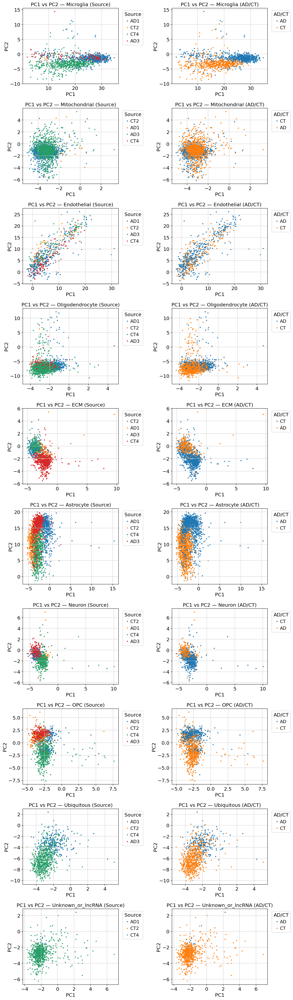

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assumptions (per your instructions):
# - `adata_full` is in the environment
# - PCA is stored in adata_full.obsm['X_pca']
# - cell type labels live in adata_full.obs['cell_type']
# - source labels live in adata_full.obs['Source']

pca = adata_full.obsm['X_pca']                         # (n_cells, n_pcs)
cell_types = list(adata_full.obs['cell_type'].unique())
n = len(cell_types)

fig, axs = plt.subplots(nrows=n, ncols=2, figsize=(12, 4 * n), squeeze=False)

for i, ct in enumerate(cell_types):
    mask = adata_full.obs['cell_type'] == ct
    pcs = pca[mask.values]                             # rows for this cell type
    sources = adata_full.obs.loc[mask, 'Source'].astype(str)
    sources_prefix2 = sources.str[:2]                  # first two characters

    # Left: colored by full 'Source'
    ax = axs[i, 0]
    sns.scatterplot(x=pcs[:, 0], y=pcs[:, 1], hue=sources, s=10, linewidth=0, ax=ax)
    ax.set_title(f'PC1 vs PC2 — {ct} (Source)')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.legend(title='Source', bbox_to_anchor=(1.02, 1), loc='upper left')

    # Right: colored by first-two-chars of 'Source'
    ax2 = axs[i, 1]
    sns.scatterplot(x=pcs[:, 0], y=pcs[:, 1], hue=sources_prefix2, s=10, linewidth=0, ax=ax2)
    ax2.set_title(f'PC1 vs PC2 — {ct} (AD/CT)')
    ax2.set_xlabel('PC1')
    ax2.set_ylabel('PC2')
    ax2.legend(title='AD/CT', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()

Plotting exactly the same but using PC2 and PC3 instead to get another "view" of the data - shows more variation in oligodendrocytes then originally visible

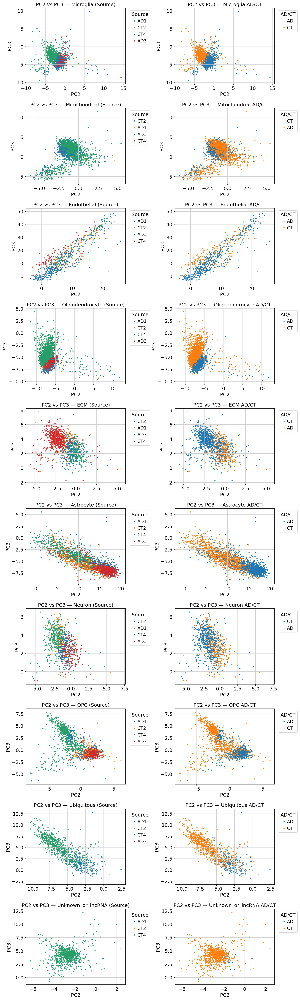

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assumptions (per your instructions):
# - `adata_full` is in the environment
# - PCA is stored in adata_full.obsm['X_pca']
# - cell type labels live in adata_full.obs['cell_type']
# - source labels live in adata_full.obs['Source']

pca = adata_full.obsm['X_pca']                         # (n_cells, n_pcs)
cell_types = list(adata_full.obs['cell_type'].unique())
n = len(cell_types)

fig, axs = plt.subplots(nrows=n, ncols=2, figsize=(12, 4 * n), squeeze=False)

for i, ct in enumerate(cell_types):
    mask = adata_full.obs['cell_type'] == ct
    pcs = pca[mask.values]                             # rows for this cell type
    sources = adata_full.obs.loc[mask, 'Source'].astype(str)
    sources_prefix2 = sources.str[:2]                  # first two characters

    # Left: colored by full 'Source'
    ax = axs[i, 0]
    sns.scatterplot(x=pcs[:, 1], y=pcs[:, 2], hue=sources, s=10, linewidth=0, ax=ax)
    ax.set_title(f'PC2 vs PC3 — {ct} (Source)')
    ax.set_xlabel('PC2')
    ax.set_ylabel('PC3')
    ax.legend(title='Source', bbox_to_anchor=(1.02, 1), loc='upper left')

    # Right: colored by first-two-chars of 'Source'
    ax2 = axs[i, 1]
    sns.scatterplot(x=pcs[:, 1], y=pcs[:, 2], hue=sources_prefix2, s=10, linewidth=0, ax=ax2)
    ax2.set_title(f'PC2 vs PC3 — {ct} AD/CT')
    ax2.set_xlabel('PC2')
    ax2.set_ylabel('PC3')
    ax2.legend(title='AD/CT', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()